**Don't forget kaggle.json file**

Steps to download Kaggle datasets in Google Colab

https://www.kaggle.com/general/156610

**Live Version**

https://colab.research.google.com/drive/1Co90TQhzZpIoRLx5rNB6dFzPEh1aSu4t?usp=sharing

In [ ]:
!nvidia-smi

Thu Dec  1 23:15:16 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P8    11W /  70W |      3MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!cp /content/drive/MyDrive/colab_data/kaggle.json /root/.kaggle/kaggle.json
!kaggle datasets download -d tthien/shanghaitech 
!unzip -q shanghaitech.zip

100% 332M/333M [00:11<00:00, 28.3MB/s]
100% 333M/333M [00:11<00:00, 29.2MB/s]


In [ ]:
import numpy as np
import scipy.io
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
import math
from torchvision import transforms
import torch

In [ ]:
plt.rcParams["figure.figsize"] = (20,10)

In [ ]:
def get_points(mat):
  return mat['image_info'][0][0][0][0][0]

def getHeatMap(points, height, width, scale=1):
  if scale > 1:
    print("Warning: scale usually <1 but now is {scale}")

  points = np.array(points) # need a new instance

  # TODO: is round() safe?
  heatmap_shape = (round(height*scale), round(width*scale))
  heatmap = np.zeros( heatmap_shape, dtype=np.float32 )
  points *= scale
  for point in points:
    x = math.floor(point[0])
    y = math.floor(point[1])
    heatmap[y][x] += 1

  if True:
    # gao = transforms.GaussianBlur(15, 4.)
    # heatmap2 = gao(torch.tensor([heatmap])).numpy()[0]

    heatmap2 = scipy.ndimage.gaussian_filter(heatmap, 1)

  return heatmap2


# EDA - deprecate


In [ ]:
x_folder = Path('/content/ShanghaiTech/part_B/train_data/images')
filename = x_folder / 'IMG_1.jpg'
image = Image.open(filename, mode='r')


In [ ]:
image_np = np.asarray(image)


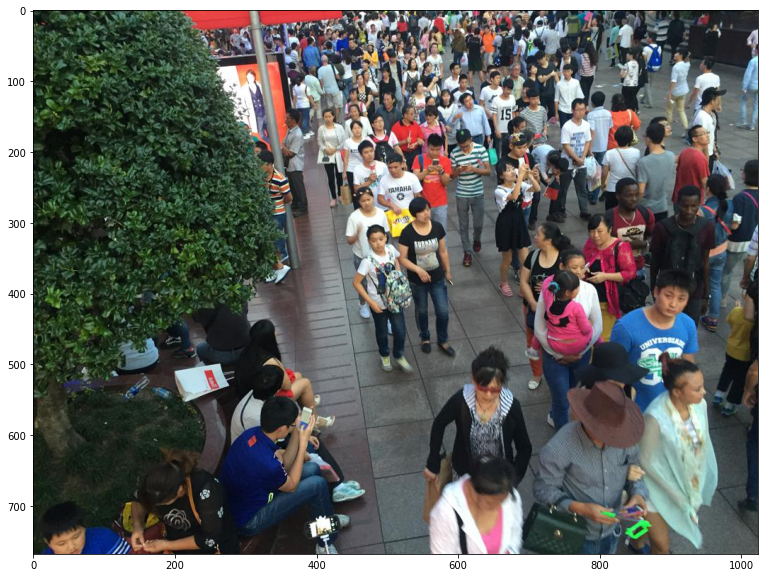

In [ ]:
plt.imshow(image_np)

In [ ]:
y_folder = Path('/content/ShanghaiTech/part_B/train_data/ground-truth')
filename = y_folder / 'GT_IMG_1.mat'
mat = scipy.io.loadmat(filename)


In [ ]:
# x label
print(type(mat['image_info'][0][0][0][0][0]))
print(mat['image_info'][0][0][0][0][0].shape)
print(repr(mat['image_info'][0][0][0][0][0][:10]))

<class 'numpy.ndarray'>
(233, 2)
array([[ 32.67954877, 753.52165403],
       [184.60695349, 690.79933098],
       [344.89733461, 577.8991495 ],
       [328.1713818 , 536.08426746],
       [329.5652112 , 473.36194441],
       [643.17682645, 533.29660866],
       [661.29660866, 681.04252518],
       [803.46720757, 580.6868083 ],
       [814.61784278, 502.63236184],
       [757.47083734, 392.51983915]])


In [ ]:
# total number of the people
print(repr(mat['image_info'][0][0][0][0][1]))
print(type(mat['image_info'][0][0][0][0][1]))

array([[233]], dtype=uint8)
<class 'numpy.ndarray'>


In [ ]:
def get_points(mat):
  return mat['image_info'][0][0][0][0][0]


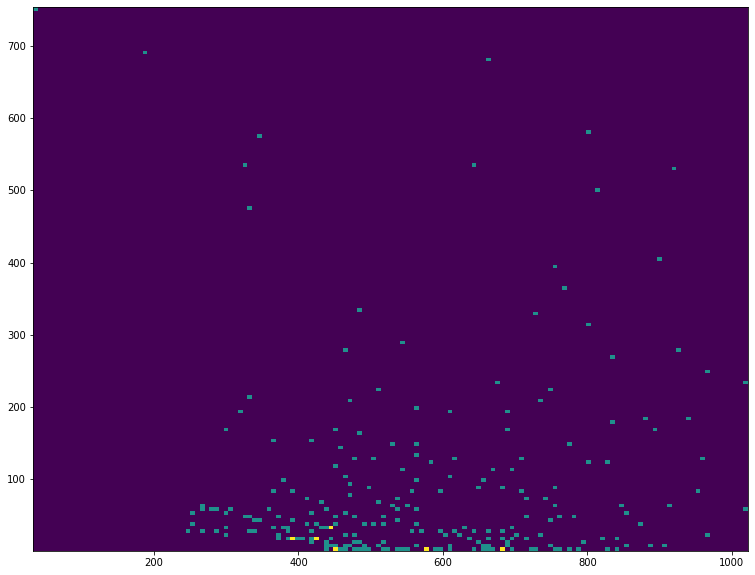

In [ ]:
# heapmap

x, y = list(zip( *get_points(mat) ))
heatmap, xedges, yedges = np.histogram2d(x, y, bins=150)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

plt.clf()
plt.imshow(heatmap.T, extent=extent, origin='lower')
plt.show()

In [ ]:
# import math
# def getHeatMap(points, height, width, scale=1):
#   if scale > 1:
#     print("Warning: scale usually <1 but now is {scale}")

#   heatmap_shape = (round(height*scale), round(width*scale))
#   heatmap = np.zeros( heatmap_shape, dtype=np.float32 )
#   points *= scale
#   for point in points:
#     x = math.floor(point[0])
#     y = math.floor(point[1])
#     heatmap[y][x] += 1

#   return heatmap


In [ ]:
heatmap = getHeatMap(get_points(mat), 768, 1024, 0.25)

In [ ]:
np.sum(heatmap)

233.0

In [ ]:
torch.tensor([heatmap]).shape

torch.Size([1, 192, 256])

In [ ]:
import seaborn as sns 
sns.set_theme()

uniform_data = np.random.rand(15, 20)

# gao = transforms.GaussianBlur(15, 4.)
# heatmap2 = gao(torch.tensor([heatmap])).numpy()[0]

heatmap2 = scipy.ndimage.gaussian_filter(heatmap, 1)


ax = sns.heatmap(heatmap2, cmap="Reds")

# ax = sns.heatmap(get_points(mat), cmap="YlGnBu")

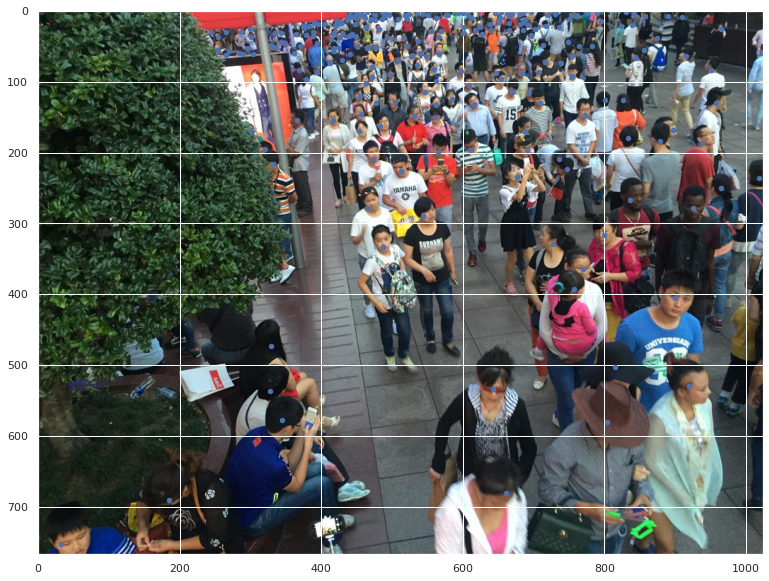

In [ ]:
plt.imshow(image_np)
plt.scatter(x, y, s=20)

# Define Dataset

In [ ]:
from torch.utils.data import Dataset
from torchvision import transforms
import torchvision.transforms.functional as trans_F
import os


In [ ]:
class ImageLabelRandomCrop(transforms.RandomCrop):
  @staticmethod
  def getBoundChecker(h, w):
    def isInbound(location):
      pw, ph = location
      return True if \
        (ph > 0) and (ph < h) and (pw > 0) and (pw < w) \
        else False
    return isInbound



  def forward(self, img, label):
    """
    Args:
        img (PIL Image or Tensor): Image to be cropped.

    Returns:
        PIL Image or Tensor: Cropped image.
    """
    if self.padding is not None:
        img = trans_F.pad(img, self.padding, self.fill, self.padding_mode)

    _, height, width = trans_F.get_dimensions(img)
    # pad the width if needed
    if self.pad_if_needed and width < self.size[1]:
        padding = [self.size[1] - width, 0]
        img = trans_F.pad(img, padding, self.fill, self.padding_mode)
    # pad the height if needed
    if self.pad_if_needed and height < self.size[0]:
        padding = [0, self.size[0] - height]
        img = trans_F.pad(img, padding, self.fill, self.padding_mode)

    i, j, h, w = self.get_params(img, self.size)

    label[:,0] -= j
    label[:,1] -= i

    inbound_checker = self.getBoundChecker(h, w)
    new_label = list(filter(inbound_checker, label))

    return trans_F.crop(img, i, j, h, w), new_label



class ShanghaiTechPartBDataset(Dataset):
  """
  @param dataset_folder - the path to the dataset folder which contains
      "test_data" and "train_data"
  @param image_size - output size of the `X`. If the input resolution 
            is too large, the image will be cropped. The format
            of the input is (`height`, `width`)
  @param train - choose between "train_data" and "test_data"

  Example Usage
    dataset = ShanghaiTechPartBDataset("/content/ShanghaiTech/part_B", image_size=(512,512), train=True)
  """
  def __init__(self, dataset_folder, image_size=(512,512), train=True):
    self.dataset_path = Path(dataset_folder) / ('train_data' if train else 'test_data')
    self.images_path = self.dataset_path / 'images'
    self.y_path = self.dataset_path / 'ground-truth'
    
    # cache image names
    self.images_list = os.listdir(self.images_path)
    y_list = []
    for image_name in self.images_list:
      y_name = 'GT_' + image_name.split('.')[0] + '.mat'

      # file check
      try:
        os.lstat(self.y_path / y_name)
      except FileNotFoundError as e:
        raise e

      y_list.append(y_name)

    self.y_list = y_list

    # image size
    self.image_size = image_size
    if image_size is None:
      # use original resolution
      self.cropFn = None
      self.image_size = np.asarray(
          Image.open(self.images_path/self.images_list[0], mode='r')
      ).shape[:2]
    else:
      self.cropFn = ImageLabelRandomCrop(size=image_size)

  def __len__(self):
    return len(self.images_list)

  def __getitem__(self, index):
    image_path = self.images_path / self.images_list[index]
    y_path = self.y_path / self.y_list[index]

    image = Image.open(image_path, mode='r')
    mat = scipy.io.loadmat(y_path)
    y = mat['image_info'][0][0][0][0][0]

    if self.cropFn is not None:
      image, y = self.cropFn(image, y)

    image = np.asarray(image, dtype=np.float32)
    image = np.transpose(image, (2,0,1))
    y = np.asarray(y)

    shape = self.image_size
    lr_y = getHeatMap(y, shape[0], shape[1], 0.25)
    hr_y = getHeatMap(y, shape[0], shape[1], 1)

    lr_y2 = scipy.ndimage.gaussian_filter(lr_y, 1)
    hr_y2 = scipy.ndimage.gaussian_filter(hr_y, 1)

    return image, lr_y, hr_y

In [ ]:
# i = np.asarray(Image.open(r"/content/ShanghaiTech/part_B/train_data/images/IMG_1.jpg", mode='r'))

In [ ]:
# i.shape[:2]

In [ ]:
# dataset = ShanghaiTechPartBDataset("/content/ShanghaiTech/part_B", image_size=(512,512), train=True)

In [ ]:
# data = dataset[0]
# plt.imshow( np.transpose(data[0], (1,2,0)) )
# x_data, y_data = zip(*data[1])
# plt.scatter(x_data, y_data)

# Define Model

In [ ]:
from torch import nn
import torch


In [ ]:
from torch.nn.modules import BatchNorm2d
class CrowdNet(nn.Module):
  def __init__(self):
    super().__init__()
    self.lrCNN1 = nn.Sequential(
        nn.Conv2d(3, 64, 3, stride=1, padding=1),
        nn.BatchNorm2d(64),
        nn.ReLU(),
        nn.Conv2d(64, 64, 3, stride=1, padding=1),
        nn.BatchNorm2d(64),
        nn.ReLU(),
        
        nn.MaxPool2d(2),

        nn.Conv2d(64, 128, 3, stride=1, padding=1),
        nn.BatchNorm2d(128),
        nn.ReLU(),
        nn.Conv2d(128, 128, 3, stride=1, padding=1),
        nn.BatchNorm2d(128),
        nn.ReLU(),

        nn.MaxPool2d(2),

        nn.Conv2d(128, 256, 3, stride=1, padding=1),
        nn.BatchNorm2d(256),
        nn.ReLU(),
    )
    self.lrCNN2 = nn.Sequential(
        nn.Conv2d(256, 256, 3, stride=1, padding=1),
        nn.BatchNorm2d(256),
        nn.ReLU(),
        nn.Conv2d(256, 256, 3, stride=1, padding=1),
        nn.BatchNorm2d(256),
        nn.ReLU(),
        nn.Conv2d(256, 196, 7, stride=1, padding=3),
        nn.BatchNorm2d(196),
        nn.ReLU(),
        nn.Conv2d(196, 96, 5, stride=1, padding=2),
        nn.BatchNorm2d(96),
        nn.ReLU(),
        nn.Conv2d(96, 32, 3, stride=1, padding=1),
        nn.BatchNorm2d(32),
        nn.ReLU(),
    )
    self.LR = nn.Conv2d(32, 1, 1, 1)

    self.hrCNN1 = nn.Sequential(
        nn.Conv2d(3, 16, 3, stride=1, padding=1),
        nn.BatchNorm2d(16),
        nn.ReLU(),
        nn.MaxPool2d(2),
        nn.Conv2d(16, 24, 5, stride=1, padding=2),
        nn.BatchNorm2d(24),
        nn.ReLU(),
        nn.MaxPool2d(2),
        nn.Conv2d(24, 48, 3, stride=1, padding=1),
        nn.BatchNorm2d(48),
        nn.ReLU(),
        nn.Conv2d(48, 48, 3, stride=1, padding=1),
        nn.BatchNorm2d(48),
        nn.ReLU(),
        nn.Conv2d(48, 24, 3, stride=1, padding=1),
        nn.BatchNorm2d(24),
        nn.ReLU(),
    )
    self.hrCNN2 = nn.Sequential(
        nn.Conv2d(281, 196, 7, stride=1, padding=3),
        nn.BatchNorm2d(196),
        nn.ReLU(),
        nn.Conv2d(196, 96, 5, stride=1, padding=2),
        nn.BatchNorm2d(96),
        nn.ReLU(),
        nn.Upsample(scale_factor=2, mode='bilinear'),
        nn.Conv2d(96, 32, 3, stride=1, padding=1),
        nn.BatchNorm2d(32),
        nn.ReLU(),
        nn.Upsample(scale_factor=2, mode='bilinear'),
    )
    self.HR = nn.Conv2d(32, 1, 1, 1)


  def forward(self, x):
    lr_feat_map1 = self.lrCNN1(x)
    lr_feat_map2 = self.lrCNN2(lr_feat_map1)
    lr_heat_map = self.LR(lr_feat_map2)

    hr_feat_map1 = self.hrCNN1(x)
    hr_feat_map1 = torch.concat(
        (lr_feat_map1, lr_heat_map, hr_feat_map1), dim=1
    )
    hr_feat_map2 = self.hrCNN2(hr_feat_map1)
    hr_heat_map = self.HR(hr_feat_map2)

    return torch.squeeze(lr_heat_map, dim=1), \
        torch.squeeze(hr_heat_map, dim=1)

In [ ]:
# crowdnet = CrowdNet()
# data = dataset[0]
# image = torch.tensor([data[0]], dtype=torch.float32)
# print(image.shape, image.dtype)
# print(len(data[1]))
# out = crowdnet(image)


In [ ]:
# out

In [ ]:
# plt.imshow(np.transpose( data[0], (1,2,0) ))
# x_data, y_data = zip(*data[1])
# plt.scatter(x_data, y_data)

In [ ]:
# ax = sns.heatmap(out[0].detach().numpy()[0], cmap="Reds")

In [ ]:
# ax = sns.heatmap(out[1].detach().numpy()[0], cmap="Reds")

# Loss Function

In [ ]:
import torch.nn.functional as nn_F

In [ ]:
class CrowdNetLoss(nn.Module):
  def __init__(self, lambda_l, lambda_h):
    super().__init__()
    self.lambda_l = lambda_l
    self.lambda_h = lambda_h

  def forward(self, lr_pred_y, hr_pred_y, lr_y, hr_y):
    lr_loss = nn_F.mse_loss(lr_pred_y, lr_y)
    hr_loss = nn_F.mse_loss(hr_pred_y, hr_y)
    return self.lambda_l * lr_loss + self.lambda_h * hr_loss

In [ ]:
# np.asarray(data[1])

In [ ]:
# print(data[1])

# sns.heatmap(getHeatMap(data[1], 512, 512, 0.25), cmap="Reds")

In [ ]:
# loss_fn = CrowdNetLoss(0.5, 0.5)
# lr_y = getHeatMap(data[1], 512, 512, 0.25)
# hr_y = getHeatMap(data[1], 512, 512, 1)
# lr_y = torch.tensor([lr_y], dtype=torch.float32)
# hr_y = torch.tensor([hr_y], dtype=torch.float32)
# loss_v = loss_fn(out[0], out[1], lr_y, hr_y)

In [ ]:
# loss_v

# Integration Test - deprecate

In [ ]:
from torch import optim
crowdnet = CrowdNet()
optimizer = optim.SGD(crowdnet.parameters(), lr=0.01)
loss_fn = CrowdNetLoss(0.5, 0.5)

In [ ]:
data = dataset[0]
image = torch.tensor([data[0]], dtype=torch.float32)
print(image.shape, image.dtype)
print(len(data[1]))
optimizer.zero_grad()
out = crowdnet(image)


torch.Size([1, 3, 512, 512]) torch.float32
1


In [ ]:
lr_y = getHeatMap(data[1], 512, 512, 0.25)
hr_y = getHeatMap(data[1], 512, 512, 1)
lr_y = torch.tensor([lr_y], dtype=torch.float32)
hr_y = torch.tensor([hr_y], dtype=torch.float32)
loss_v = loss_fn(out[0], out[1], lr_y, hr_y)

In [ ]:
loss_v.dtype

torch.float32

In [ ]:
print(loss_v)

tensor(0.0026, grad_fn=<AddBackward0>)


In [ ]:
loss_v.backward()
optimizer.step()

In [ ]:
sns.heatmap(out[0][0].detach().numpy(), cmap="Reds")

In [ ]:
sns.heatmap(getHeatMap(data[1], 512, 512, 0.25), cmap="Reds")

# Train

In [ ]:
# from tqdm import tqdm
from tqdm.notebook import tqdm
import copy
import time
import seaborn as sns
from torch.utils.tensorboard import SummaryWriter
!pip install -q tensorboard



In [ ]:
DEVICE = torch.device('cuda:0')

In [ ]:
CHECKPOINT_FOLDER = Path(r"/content/drive/MyDrive/colab_data/checkpoints")

In [ ]:
@torch.no_grad()
def val_acc(m, loss_fn, valloader):
  # TODO: WIP
  total_num = 0
  correct_num = 0
  loss_list = []
  m = m.eval()
  for x, y in valloader:
    x = x.to(DEVICE)
    y = y.to(DEVICE)
    y_pred = m(x)
    
    loss = loss_fn(y_pred, y)
    loss_list.append(loss.item())

    y_pred = torch.argmax(y_pred, dim=1)
    correct_num += torch.sum( (y_pred == y)*1 ).item()
    total_num += len(y)

  return correct_num / total_num, sum(loss_list) / len(loss_list)

def train(epoch, m, loss_fn, optimizer, trainloader, valloader=None, best_epoch_start=200):
  pbar = tqdm(range(epoch))
  loss_list = []
  val_acc_list = []
  val_acc_v = 0.
  val_loss = 0.
  best_model = copy.deepcopy(m.state_dict())
  best_val_acc = 0.
  best_epoch = best_epoch_start
  total_time = 0.

  writer = SummaryWriter()

  for i in pbar:
    sub_loss_list = []

    m = m.train()
    start = time.time()
    for x, lr_y, hr_y in trainloader:
      x = x.to(DEVICE)
      lr_y = lr_y.to(DEVICE)
      hr_y = hr_y.to(DEVICE)

      # forward
      lr_pred, hr_pred = m(x)

      # calculate loss
      optimizer.zero_grad()
      loss = loss_fn(lr_pred, hr_pred, lr_y, hr_y)
      loss_num = loss.item()
      sub_loss_list.append(loss_num)
      pbar.set_description(f'val_acc={val_acc_v:.4} val_loss={val_loss:.4} loss={loss_num:.4}') 

      # backaward
      loss.backward()
      optimizer.step()

    end = time.time()

    if valloader is not None:
      # del x; del y # free some GPU memory
      val_acc_v, val_loss = val_acc(m, loss_fn, valloader)
      pbar.set_description(f'val_acc={val_acc_v:.4} val_loss={val_loss:.4} loss={loss_num:.4}') 
      val_acc_list.append(val_acc_v)
      if (i > best_epoch) and (val_acc_v > best_val_acc):
        best_epoch = i
        best_val_acc = val_acc_v
        best_model = copy.deepcopy(m.state_dict())

    # checkpoint
    checkpoint = {}
    checkpoint['weights'] = m.state_dict()
    checkpoint['epoch'] = i + 1
    checkpoint['loss'] = loss_num
    torch.save(m.state_dict(), CHECKPOINT_FOLDER / f'crowdnet.pt')
    
    
    total_time = total_time + (end - start)
    epoch_loss = sum(sub_loss_list) / len(sub_loss_list)
    loss_list.append(epoch_loss)

    # tensorflow
    writer.add_scalar("Loss/train", epoch_loss, i)
    writer.add_scalar("time", end-start, i)

    writer.flush()


  print(f'\ntraining finished in {total_time}s. Best model at epoch={best_epoch} with val_acc={best_val_acc}')
  m.load_state_dict(best_model)
  writer.flush()
  writer.close()
  return loss_list, val_acc_list

In [ ]:
from torch.utils.data import DataLoader
dataset = ShanghaiTechPartBDataset("/content/ShanghaiTech/part_B", image_size=None, train=True)
trainloader = DataLoader(dataset, batch_size=3)

In [ ]:
DEVICE = torch.device('cuda:0')

In [ ]:
from torch import optim
DEVICE = torch.device('cuda:0')
crowdnet = CrowdNet()
optimizer = optim.SGD(crowdnet.parameters(), lr=0.05, momentum=0.9, weight_decay=0)
loss_fn = CrowdNetLoss(1, 1) 



In [ ]:
optimizer = optim.SGD(crowdnet.parameters(), lr=0.003, momentum=0.9, weight_decay=0)


In [ ]:
!pip install -q torchinfo
import torchinfo
model = crowdnet.to('cuda:0')
torchinfo.summary(model, (-1,3,512,512))

In [ ]:
crowdnet = crowdnet.to(DEVICE)

In [ ]:

loss_list, v_loss_list = train(20, crowdnet, loss_fn, optimizer, trainloader, valloader=None, best_epoch_start=200)

  0%|          | 0/20 [00:00<?, ?it/s]


training finished in 7865.2955493927s. Best model at epoch=200 with val_acc=0.0


In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

%tensorboard --logdir=runs


<IPython.core.display.Javascript object>

In [ ]:
loss_list

[0.0033003333651933317,
 0.003041376197300573,
 0.002905781728340619,
 0.0028278055051758665,
 0.0027756356241515102,
 0.002746431442384205,
 0.002728065904994398,
 0.002715753117722195,
 0.0027063908385557695,
 0.002699977168361587,
 0.0026955708910002193,
 0.0026923647244224574,
 0.0026899225377380403,
 0.002687987404503623,
 0.0026864597579089006,
 0.0026852187427775518,
 0.002684178504547271,
 0.00268328984384425,
 0.0026825192804038247,
 0.0026818401129819007]

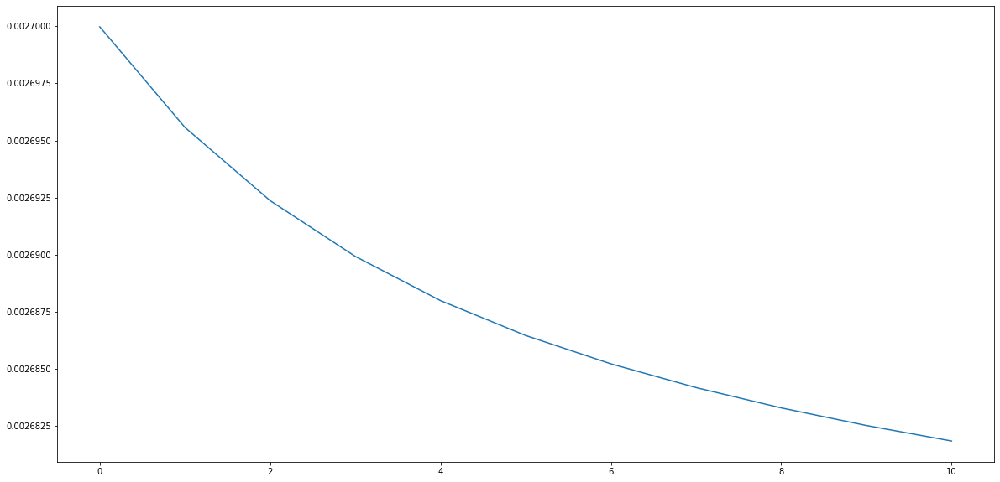

In [ ]:
plt.plot(loss_list[9:])

In [ ]:
@torch.no_grad()
def drawEval(model, dataset):
  model = model.to('cpu')
  data = dataset[0]
  image = torch.tensor([data[0]], dtype=torch.float32)
  print(image.shape, image.dtype)
  print(len(data[1]))
  out = crowdnet(image)

  plt.imshow( np.asarray(np.transpose(data[0], (1,2,0)), dtype=np.int8) )

  sns.heatmap(out[0].numpy()[0], cmap="Reds")
  # sns.heatmap(out[1].detach().numpy()[0], cmap="Reds")
  sns.heatmap(data[1], cmap="Reds")

In [ ]:
drawEval(crowdnet, dataset)

NameError: ignored

<ipython-input-43-5d6029ab8ad4>:4: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  image = torch.tensor([data[0]], dtype=torch.float32)


torch.Size([1, 3, 768, 1024]) torch.float32
192


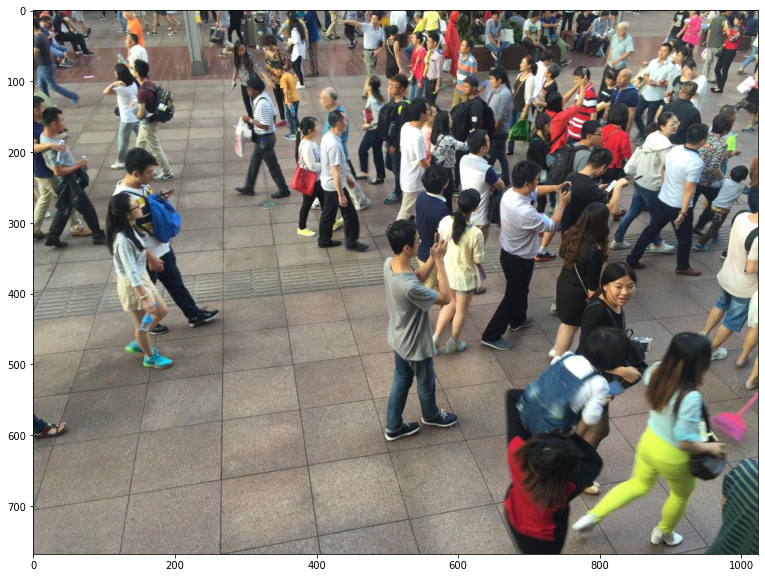

In [ ]:
model = crowdnet
model = model.to('cpu')
data = dataset[0]
image = torch.tensor([data[0]], dtype=torch.float32)
print(image.shape, image.dtype)
print(len(data[1]))
out = crowdnet(image)

plt.imshow( np.transpose(np.asarray(data[0], dtype=int), (1,2,0)) )


# sns.heatmap(out[1].detach().numpy()[0], cmap="Reds")


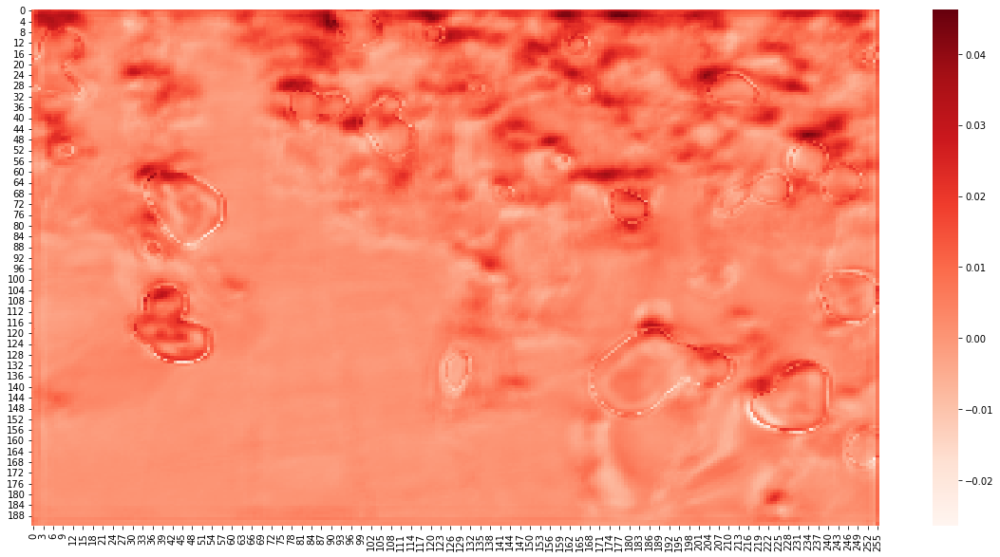

In [ ]:
sns.heatmap(out[0].detach().numpy()[0], cmap="Reds")

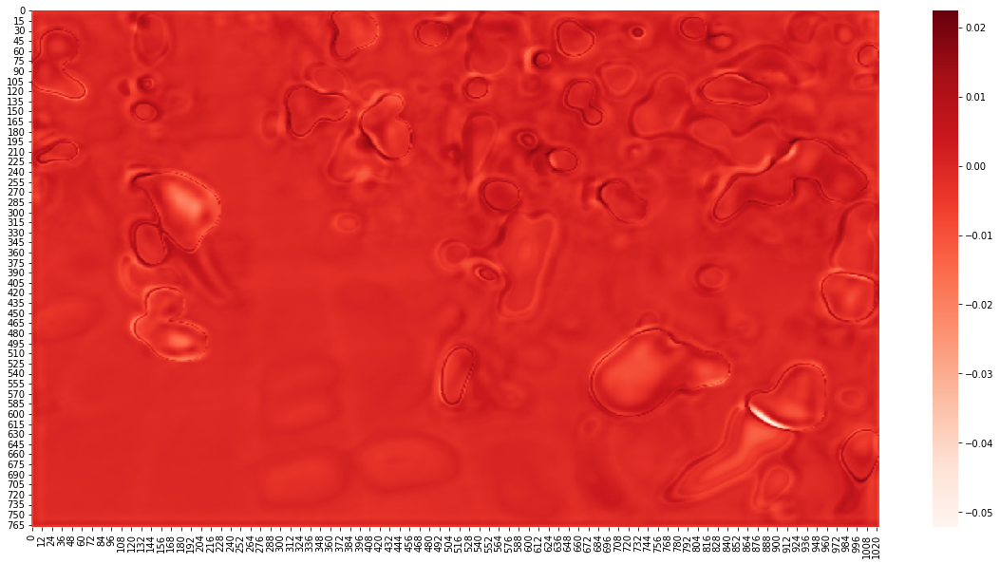

In [ ]:
sns.heatmap(out[1].detach().numpy()[0], cmap="Reds")

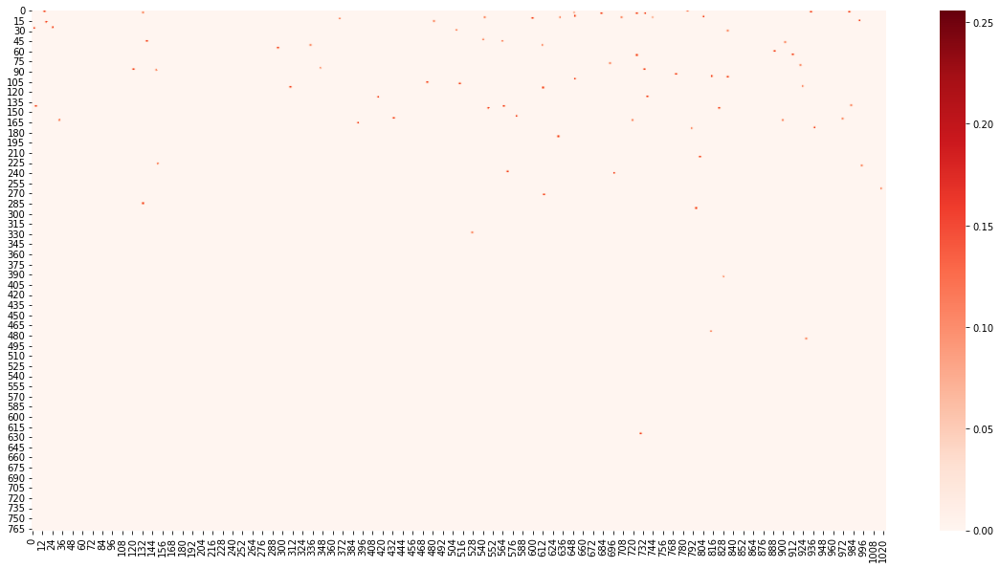

In [ ]:
sns.heatmap(data[2], cmap="Reds")

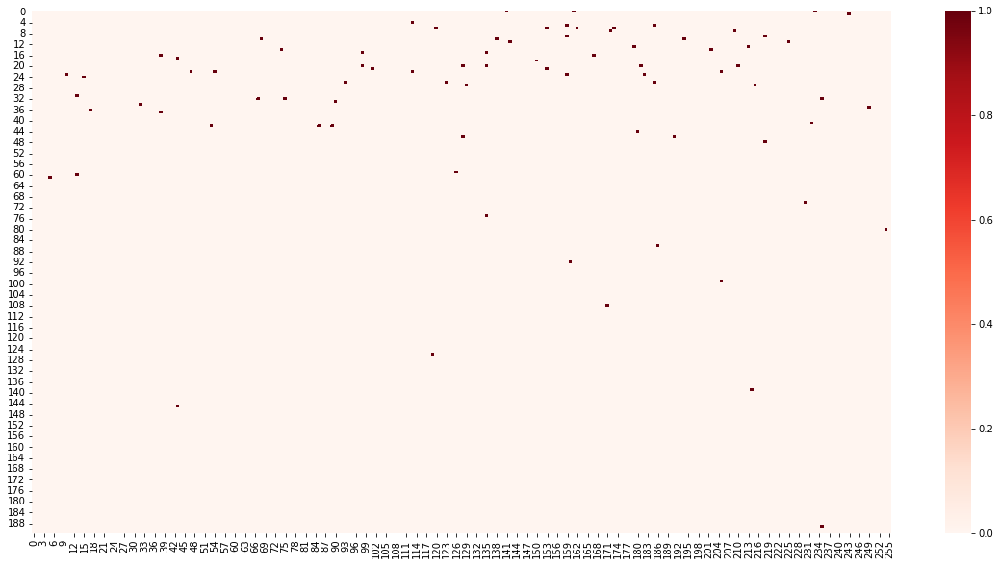

In [ ]:
sns.heatmap(data[1], cmap="Reds")

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

NameError: ignored